# **IMAGE PROCESSING**

## **Color Mappings**

In [1]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
img=cv2.imread("../DATA/00-puppy.jpg")

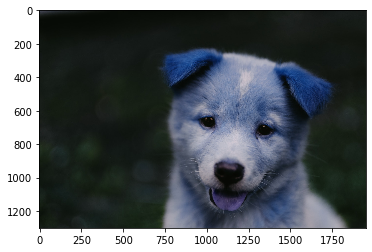

In [3]:
plt.imshow(img)

In [4]:
img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

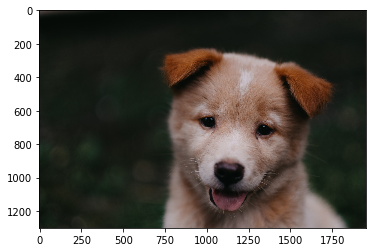

In [5]:
plt.imshow(img)

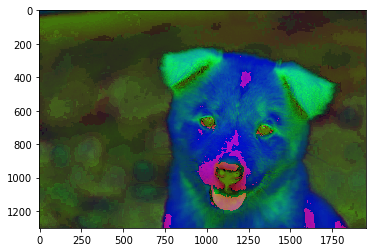

In [6]:
hsv_img=img.copy()
hsv_img=cv2.cvtColor(hsv_img, cv2.COLOR_RGB2HSV)
plt.imshow(hsv_img)

In [7]:
hls_img=img.copy()
hls_img=cv2.cvtColor(hls_img, cv2.COLOR_RGB2HLS)

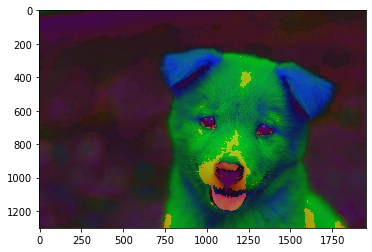

In [8]:
plt.imshow(hls_img)

## **Blending and Pasting Images**

To blend images, use the following formula:

new_pixel= (alpha)x(pixel_1) + (beta)x(pixel_2) + (gamma)

In [9]:
img1=cv2.imread("../DATA/dog_backpack.jpg")
img1=cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2=cv2.imread("../DATA/watermark_no_copy.png")
img2=cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

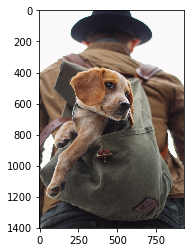

In [10]:
plt.imshow(img1)

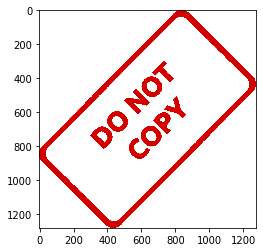

In [11]:
plt.imshow(img2)

In [12]:
img1.shape

(1401, 934, 3)

In [13]:
img2.shape

(1280, 1277, 3)

In [14]:
img1=cv2.resize(img1, (1200, 1200))

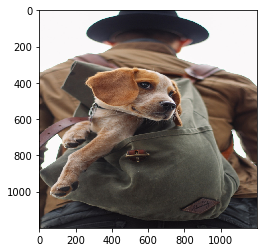

In [15]:
plt.imshow(img1)

In [16]:
img2=cv2.resize(img2, (1200, 1200))

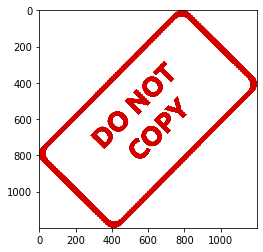

In [17]:
plt.imshow(img2)

In [18]:
blend_img=cv2.addWeighted(src1=img1, alpha=0.8, src2=img2, beta=0.3, gamma=0)

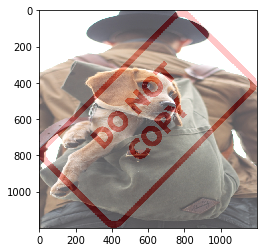

In [19]:
plt.imshow(blend_img)

In [20]:
blend_img=cv2.addWeighted(src1=img1, src2=img2, alpha=0.5, beta=0.1, gamma=0)

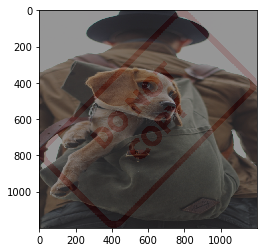

In [21]:
plt.imshow(blend_img)

The above was for images with equal sizes. Now small image on top of a large image, follow the below method (no blending and blending).

In [22]:
#Overlaying- No blending
img1=cv2.imread("../DATA/dog_backpack.jpg")
img1=cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2=cv2.imread("../DATA/watermark_no_copy.png")
img2=cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

In [23]:
img2=cv2.resize(img2, (600, 600))

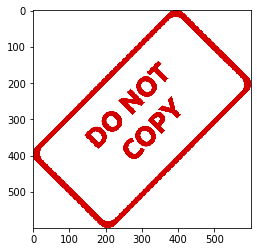

In [24]:
plt.imshow(img2)

In [25]:
print("Large Image:", img1.shape)
print("Small Image:", img2.shape)

Large Image: (1401, 934, 3)
Small Image: (600, 600, 3)


In [26]:
large_img=img1.copy()
small_img=img2.copy()

In [27]:
x_offset, y_offset=0, 0

In [28]:
x_end=x_offset+small_img.shape[1]
y_end=y_offset+small_img.shape[0]

In [29]:
large_img[y_offset:y_end, x_offset:x_end]=small_img

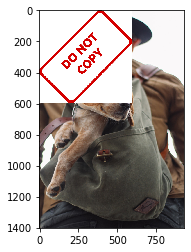

In [30]:
plt.imshow(large_img)

In [31]:
#Blending images with images of different sizes.

## **Blurring and Smoothing**

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
def load_img():
    img=cv2.imread("../DATA/bricks.jpg").astype(np.float32)/255
    img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [5]:
def display_img(img):
    fig=plt.figure(figsize=(12,10))
    ax=fig.add_subplot(111)
    ax.imshow(img)

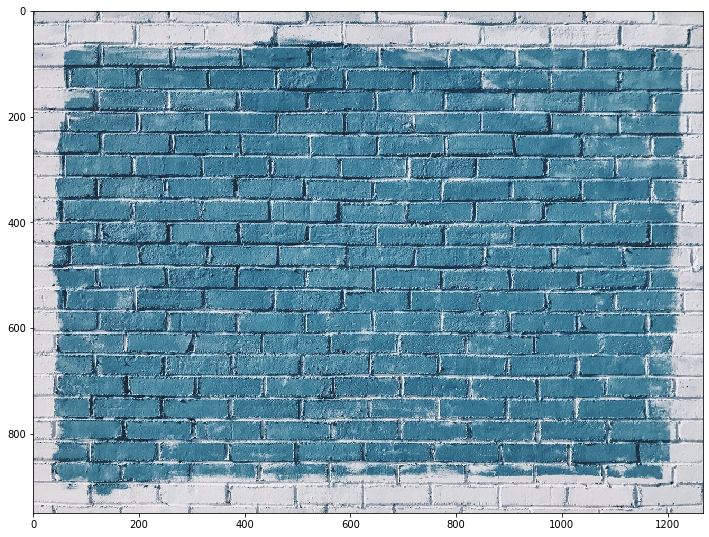

In [7]:
display_img(load_img())

In [9]:
gamma=1/4
res=np.power(load_img(), gamma)

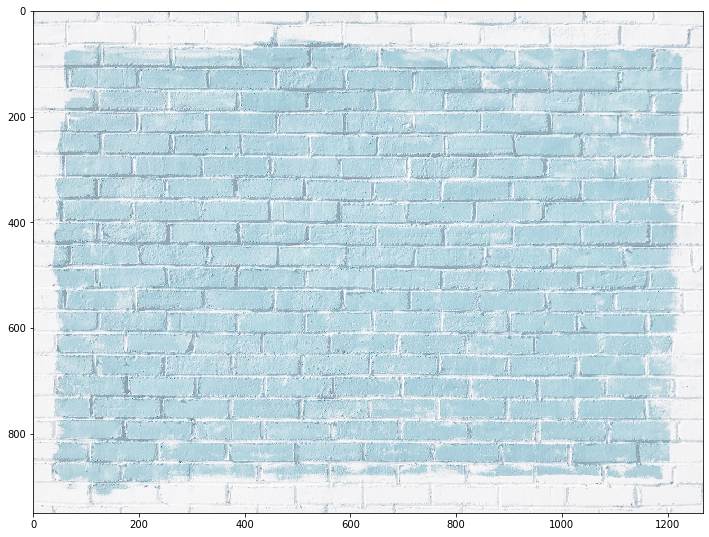

In [10]:
display_img(res)

In [11]:
i=load_img()

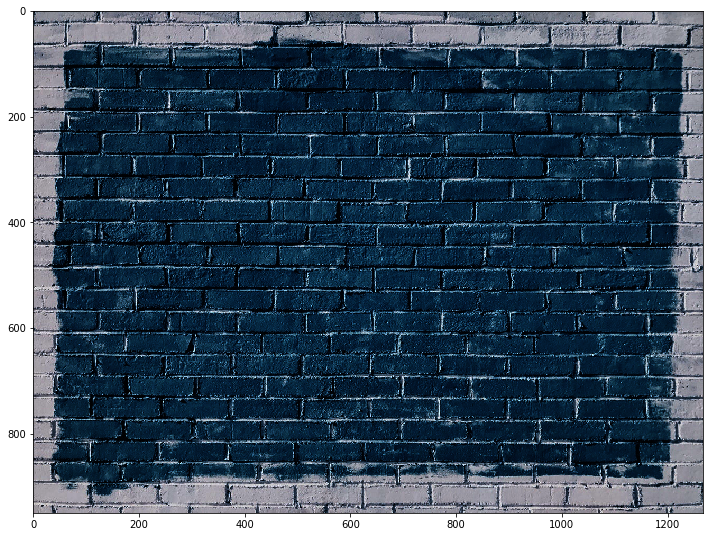

In [14]:
gamma=3
res=np.power(i, gamma)
display_img(res)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


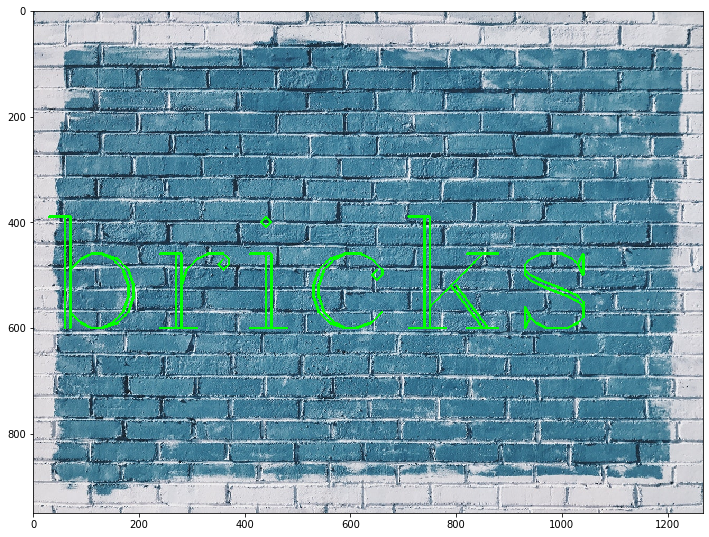

In [16]:
img=load_img()
font=cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img, text="bricks", org=(10, 600), fontFace=font, fontScale=10, color=(0, 255, 0), thickness=4)
display_img(img)

In [17]:
kernel=np.ones(shape=(5, 5), dtype=np.float32)/25

In [18]:
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


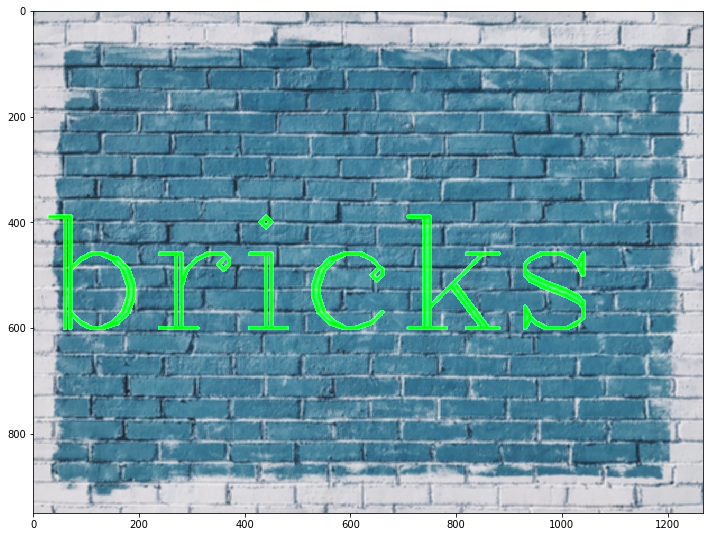

In [19]:
dst=cv2.filter2D(img, -1, kernel)
#desired depth= -1
display_img(dst)

In [22]:
img=load_img()
font=cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img, text="bricks", org=(10, 600), fontFace=font, fontScale=10, color=(0, 255, 0), thickness=4)

reset image


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


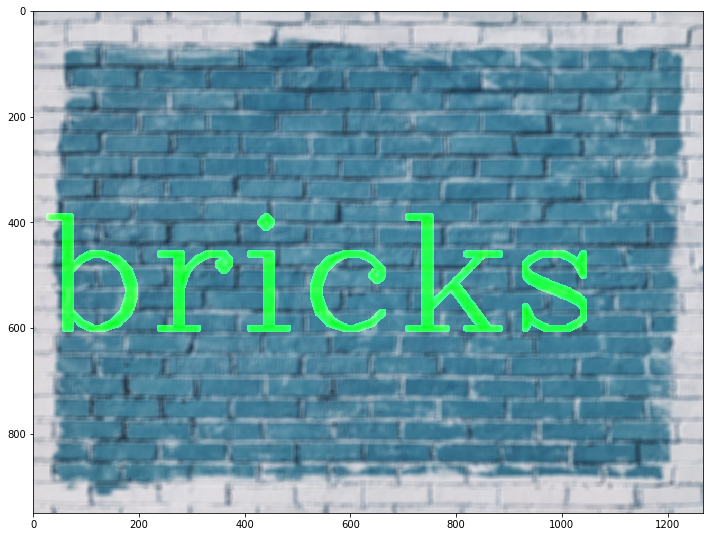

In [24]:
blurred=cv2.blur(img, ksize=(10,10))
display_img(blurred)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


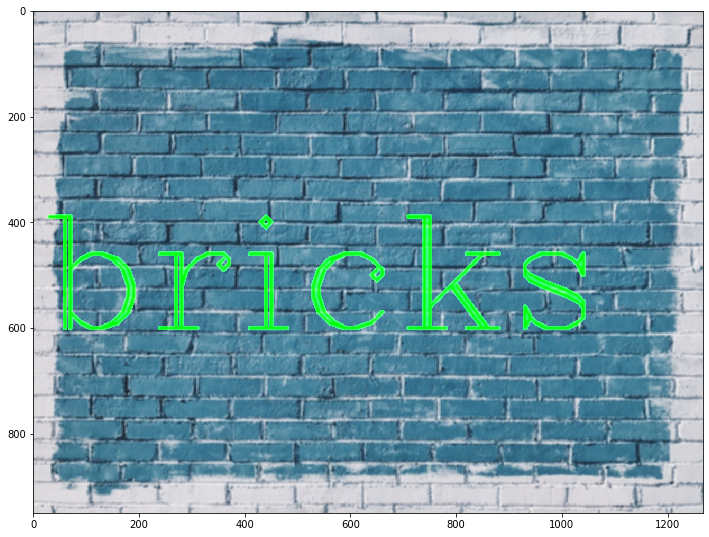

In [25]:
blurred=cv2.blur(img, ksize=(5,5))
display_img(blurred)

In [27]:
img=load_img()
font=cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img, text="bricks", org=(10, 600), fontFace=font, fontScale=10, color=(0, 255, 0), thickness=4)
print("reset image again")

reset image again


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


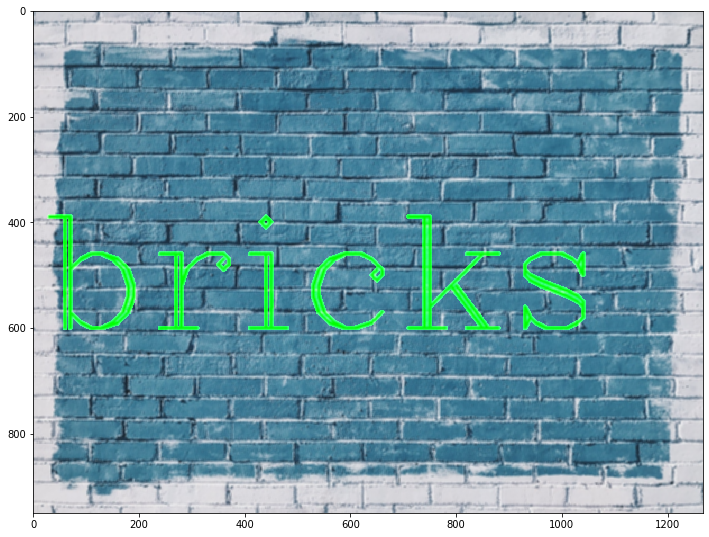

In [29]:
blurred=cv2.GaussianBlur(img, ksize=(5,5), sigmaX=10)
display_img(blurred)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


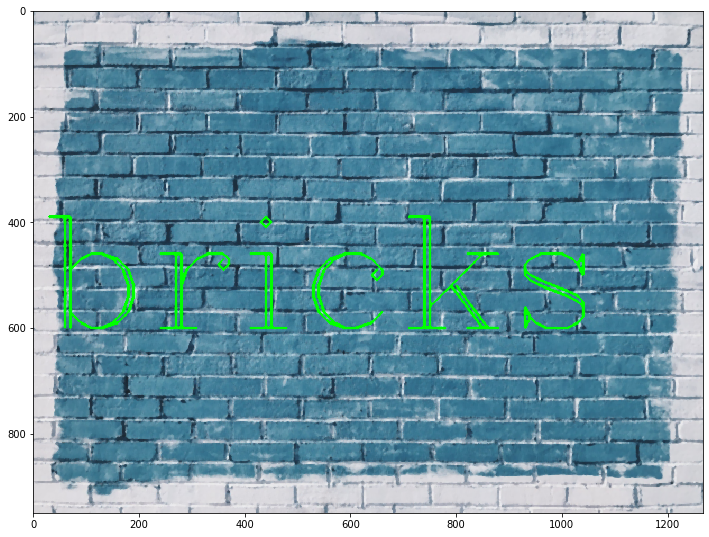

In [31]:
blurred=cv2.medianBlur(img, 5)
#this has to be a square, so only one parameter for ksize is enough
display_img(blurred)

In [32]:
img=cv2.imread("../DATA/sammy.jpg")
img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

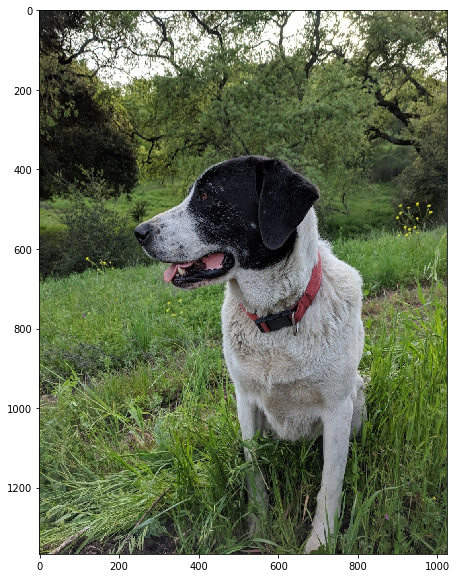

In [33]:
display_img(img)

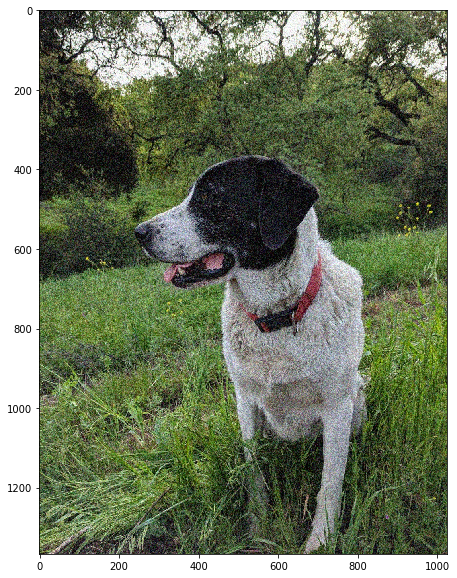

In [34]:
noise_img=cv2.imread("../DATA/sammy_noise.jpg")
display_img(noise_img)

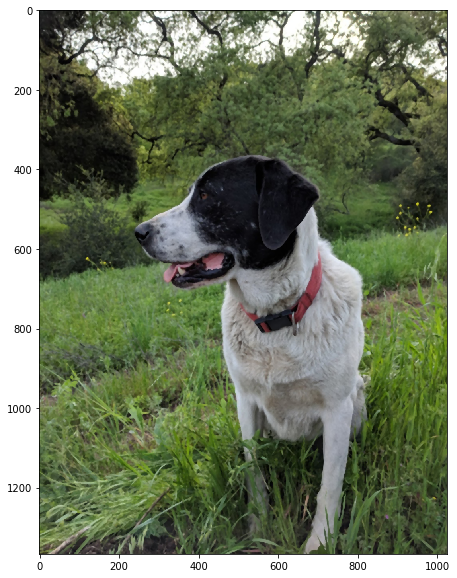

In [37]:
median=cv2.medianBlur(img, 5)
display_img(median)
#this blurrs the image, gets rid of the noises but some details will be lost

In [38]:
img=load_img()
font=cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img, text="bricks", org=(10, 600), fontFace=font, fontScale=10, color=(0, 255, 0), thickness=4)
print("reset image again")

reset image again


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


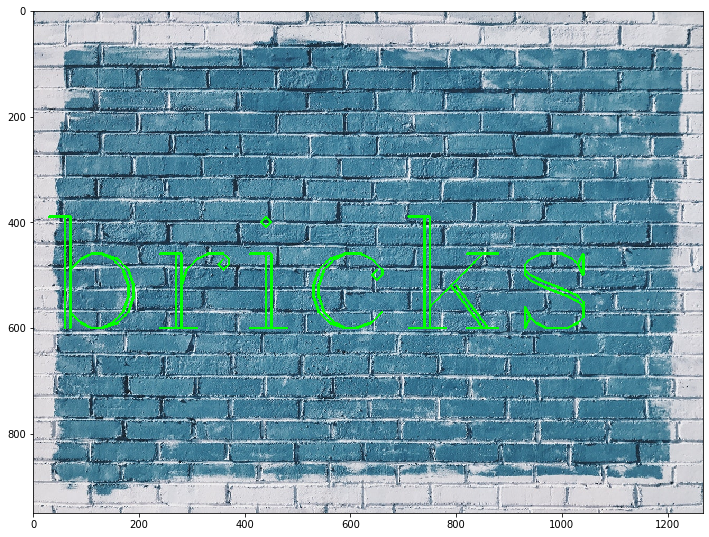

In [40]:
display_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


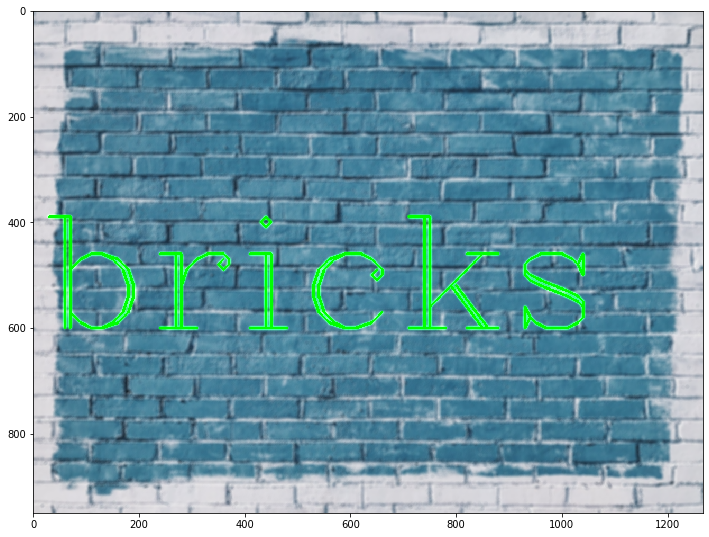

In [41]:
blur=cv2.bilateralFilter(img, 9, 75, 75)
display_img(blur)

## **Morphological Operators**

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

def load_img():
    blank_img=np.zeros((600, 600))
    font=cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(blank_img, text="ABCDE", org=(50, 300), fontFace=font, fontScale=5, color=(255, 255, 255), thickness=25,lineType=cv2.LINE_AA)
    return blank_img

In [2]:
def display_img(img):
    fig=plt.figure(figsize=(12, 10))
    ax=fig.add_subplot(111)
    ax.imshow(img, cmap="gray")

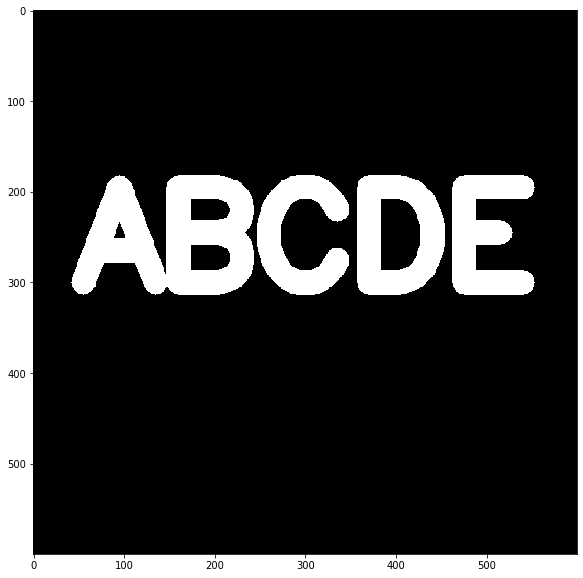

In [16]:
img=load_img()
display_img(img)

#### **Erosion**

In [17]:
kernel=np.ones((5,5), dtype=np.uint8)

In [18]:
kernel

array([[1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1]], dtype=uint8)

In [24]:
result=cv2.erode(img, kernel, iterations=5)

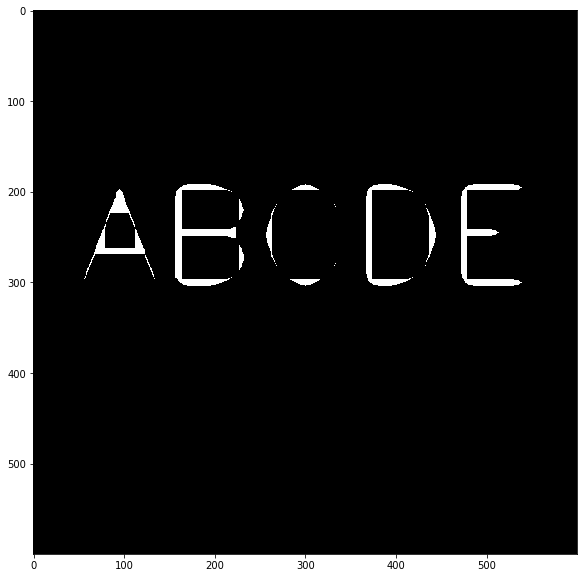

In [25]:
display_img(result)

In [26]:
kernel=np.ones((5,5), dtype=np.uint8)

In [27]:
res=cv2.erode(img, kernel, iterations=3)

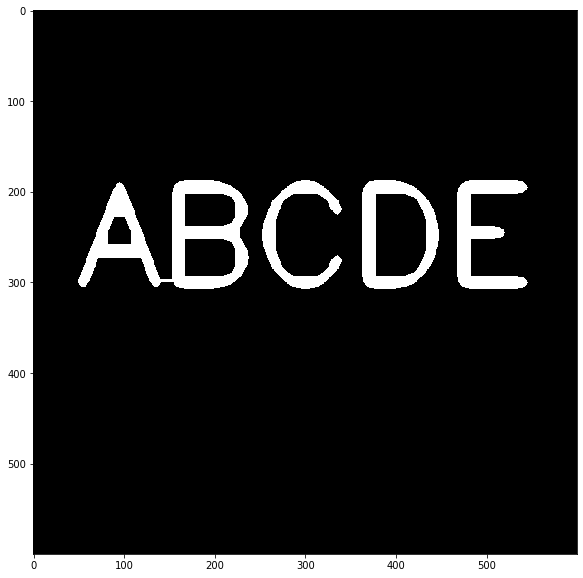

In [28]:
display_img(res)

#### **Opening: Erosion + Dilation**
Dilation is opposite of erosion. It helps remove the foreground in the image. Opening helps in removing background noise. 

In [29]:
img=load_img()

In [30]:
white_noise=np.random.randint(low=0, high=2, size=(600,600))

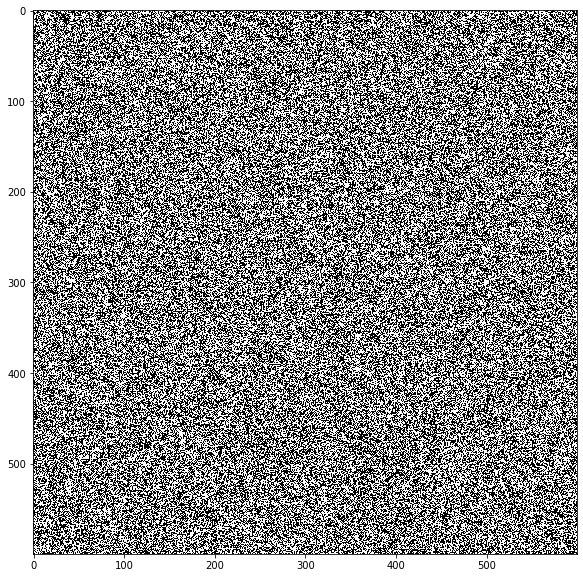

In [32]:
display_img(white_noise)

In [33]:
img.max()

255.0

In [35]:
white_noise=white_noise*255.0

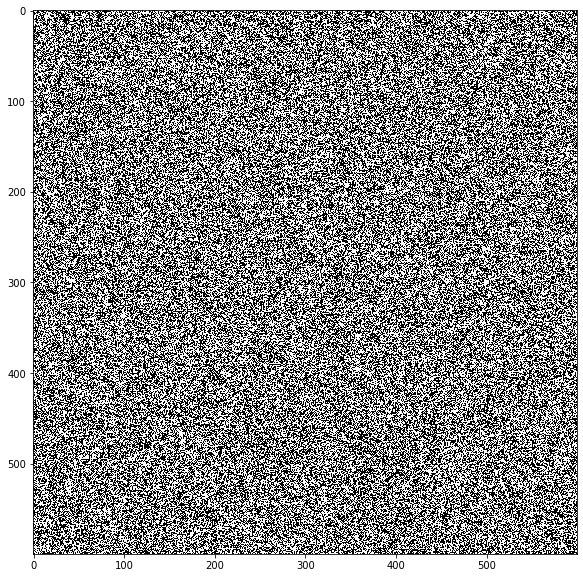

In [36]:
display_img(white_noise)

In [37]:
noise_img=white_noise+img

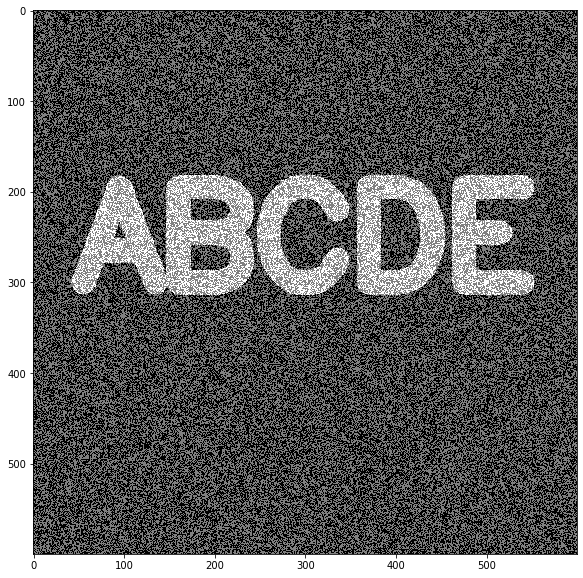

In [38]:
display_img(noise_img)

In [39]:
opening=cv2.morphologyEx(noise_img, cv2.MORPH_OPEN, kernel)

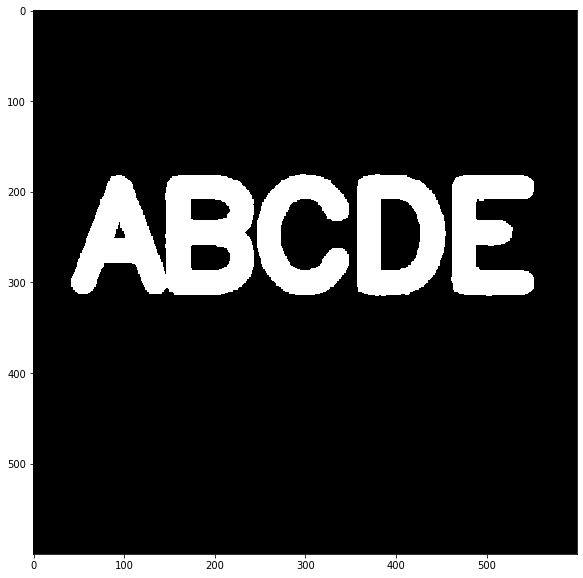

In [40]:
display_img(opening)